In [1]:
!python --version

Python 3.12.3


In [2]:
!nvidia-smi

Mon Nov 24 10:33:16 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 572.47                 Driver Version: 572.47         CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   46C    P8              1W /   40W |     689MiB /   6141MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [47]:
import pandas as pd

train_df = pd.read_csv(r'data\train.csv')
train_df.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [48]:
mapping = {
    "1_0_0_0": 0,
    "0_1_0_0": 1,
    "0_0_1_0": 2,
    "0_0_0_1": 3,
}

labels = train_df.columns.to_list()
classes = [col for col in train_df.columns if col != "image_id"]

train_df['combined'] = train_df[classes].astype(str).agg('_'.join, axis=1)
train_df["label"] = train_df["combined"].map(mapping)
drop_columns = ["combined"] + classes
train_df = train_df.drop(columns=drop_columns)

In [49]:
train_df.head()

,image_id,label
0,Train_0,3
1,Train_1,1
2,Train_2,0
3,Train_3,2
4,Train_4,0


In [50]:
from sklearn.model_selection import train_test_split

train_df, valid_df = train_test_split(
    train_df,
    test_size=0.2,
    stratify=train_df['label'],
    random_state=42
)

In [51]:
train_df.shape[0]

1456

In [52]:
valid_df.shape[0]

365

In [64]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import transforms
from torchvision.models import resnet18, ResNet18_Weights

from PIL import Image
import matplotlib.pyplot as plt

In [35]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [37]:
class PlantDataset(Dataset):
    
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        image_src = f"data/images/{row.image_id}.jpg"
        image = Image.open(image_src).convert("RGB")

        labels = row.label
        labels = torch.tensor(labels, dtype=torch.float32)

        if self.transform:
            image = self.transform(image)

        return image, labels

In [53]:
SIZE = 224

transforms_train = transforms.Compose([
    transforms.RandomResizedCrop(SIZE, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(1),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transforms_valid = transforms.Compose([
    transforms.Resize((SIZE, SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

In [69]:
BATCH_SIZE = 64

train_dataset = PlantDataset(train_df, transform=transforms_train)
valid_dataset = PlantDataset(valid_df, transform=transforms_valid)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)

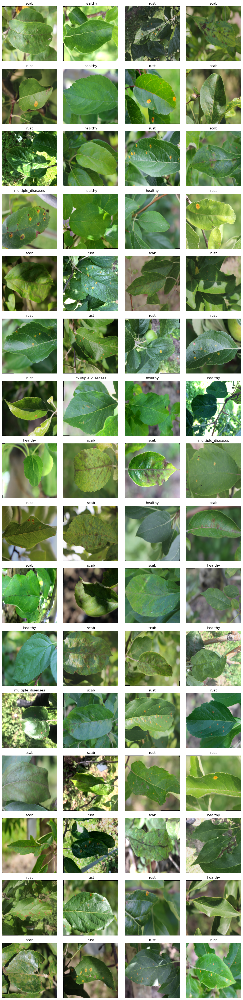

In [70]:
def unnormalize(img):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return img * std + mean

images, labels = next(iter(train_loader))
batch_size = images.shape[0]
cols = 4
rows = (batch_size + cols - 1) // cols

plt.figure(figsize=(12, rows * 3))

for i in range(min(batch_size, rows * cols)):
    plt.subplot(rows, cols, i + 1)

    img = unnormalize(images[i])
    img = img.permute(1, 2, 0).cpu().numpy()
    plt.imshow(img)
    
    name_label = classes[int(labels[i].item())]
    plt.title(f"{name_label}")

    plt.axis("off")

plt.tight_layout()
plt.show()

In [65]:
class PlantModel(nn.Module):
    def __init__(self, num_classes=4):
        super().__init__()

        # Load pretrained ResNet18
        weights = ResNet18_Weights.DEFAULT
        self.backbone = resnet18(weights=weights)
        in_features = self.backbone.fc.in_features
        
        # Remove old classifier
        self.backbone.fc = nn.Identity()

        # New classification
        self.classifier = nn.Linear(in_features, num_classes)

        # Freeze backbone
        for p in self.backbone.parameters():
            p.requires_grad = False

    def forward(self, x):
        features = self.backbone(x)
        features = F.dropout(features, 0.25, training=self.training)
        logits = self.classifier(features)
        return logits

In [67]:
def count_trainable(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

model = PlantModel(num_classes=len(classes))
model = model.to(device)
print("Trainable parameters:", count_trainable(model))

Trainable parameters: 2052


In [81]:
from tqdm import tqdm

class CancelTrainException(Exception): pass

class LRFinder:

    def __init__(self, model, data_loader, loss_func, opt, lr_range, max_iter):
        self.lrs = []
        self.losses = []
        self.model = model
        self.data_loader = data_loader
        self.loss_func = loss_func
        self.opt = opt
        self.lr_range = lr_range
        self.max_iter = max_iter

    def run(self):
        best_loss = 1e9
        i = 0
        while i < self.max_iter:
            print(f"I: {i}")
            for xb, yb in self.data_loader:
                xb, target = xb.cuda(), yb.cuda()
                
                # convert to long (class indices)
                target = target.long()
                
                pred = self.model(xb)
                
                # update learning rate
                pos = i / self.max_iter
                i += 1
                lr = self.lr_range[0] * (self.lr_range[1] / self.lr_range[0]) ** pos
                for pg in self.opt.param_groups:
                    pg['lr'] = lr

                loss = self.loss_func(pred, target)
                loss.backward()
                self.opt.step()
                self.opt.zero_grad()

                # stop if loss explodes
                if loss.item() > best_loss * 10 or i == self.max_iter:
                    raise CancelTrainException()
                if loss.item() < best_loss:
                    best_loss = loss.item()

                self.lrs.append(lr)
                self.losses.append(loss.item())

    def plot_lr(self):
        # plot lr x loss
        plt.plot(self.lrs, self.losses)
        plt.xscale('log')

In [82]:
lr_finder = LRFinder(model = model, 
                     data_loader = train_loader, 
                     loss_func = nn.CrossEntropyLoss(), 
                     opt = optim.Adam(model.parameters(),lr=1e-2), 
                     lr_range = [1e-6,1],
                     max_iter = 100)

In [83]:
lr_finder.run()

I: 0
I: 23
I: 46
I: 69


CancelTrainException: 

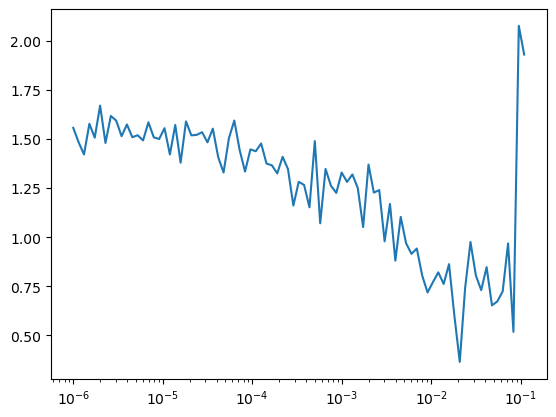

In [84]:
lr_finder.plot_lr()

In [86]:
from torch.optim.lr_scheduler import CosineAnnealingLR


model = PlantModel(num_classes=len(classes))
model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=1e-2)
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-4)

In [87]:
N_EPOCHS = 10
train_losses, valid_losses = [], []
train_accuracies, valid_accuracies = [], []

for epoch in range(N_EPOCHS):
    # --- Training ---
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{N_EPOCHS} [Train]"):
        images, labels = images.to(device), labels.to(device)
        labels = labels.long()

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    scheduler.step()

    epoch_train_loss = running_loss / len(train_loader.dataset)
    epoch_train_acc = correct / total

    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_acc)

    # --- Validation ---
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(valid_loader, desc=f"Epoch {epoch+1}/{N_EPOCHS} [Valid]"):
            images, labels = images.to(device), labels.to(device)
            labels = labels.long()

            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    epoch_val_loss = val_loss / len(valid_loader.dataset)
    epoch_val_acc = correct / total

    valid_losses.append(epoch_val_loss)
    valid_accuracies.append(epoch_val_acc)

    print(f"Epoch [{epoch+1}/{N_EPOCHS}] "
          f"Train Loss: {epoch_train_loss:.4f}, Acc: {epoch_train_acc:.4f} | "
          f"Val Loss: {epoch_val_loss:.4f}, Acc: {epoch_val_acc:.4f}")

Epoch 1/10 [Valid]: 100%|██████████| 6/6 [00:28<00:00,  4.71s/it]


Epoch [1/10] Train Loss: 1.3388, Acc: 0.5701 | Val Loss: 0.5946, Acc: 0.8027


Epoch 2/10 [Valid]: 100%|██████████| 6/6 [00:24<00:00,  4.02s/it]


Epoch [2/10] Train Loss: 0.6139, Acc: 0.7823 | Val Loss: 0.5434, Acc: 0.8356


Epoch 3/10 [Valid]: 100%|██████████| 6/6 [00:25<00:00,  4.29s/it]


Epoch [3/10] Train Loss: 0.5531, Acc: 0.7988 | Val Loss: 0.6097, Acc: 0.7644


Epoch 4/10 [Valid]: 100%|██████████| 6/6 [00:24<00:00,  4.06s/it]


Epoch [4/10] Train Loss: 0.5330, Acc: 0.7940 | Val Loss: 0.4851, Acc: 0.8384


Epoch 5/10 [Valid]: 100%|██████████| 6/6 [00:24<00:00,  4.10s/it]


Epoch [5/10] Train Loss: 0.4981, Acc: 0.8180 | Val Loss: 0.5174, Acc: 0.8082


Epoch 6/10 [Valid]: 100%|██████████| 6/6 [00:25<00:00,  4.28s/it]


Epoch [6/10] Train Loss: 0.4996, Acc: 0.8125 | Val Loss: 0.5069, Acc: 0.8192


Epoch 7/10 [Valid]: 100%|██████████| 6/6 [00:25<00:00,  4.30s/it]


Epoch [7/10] Train Loss: 0.4807, Acc: 0.8255 | Val Loss: 0.4961, Acc: 0.8438


Epoch 8/10 [Valid]: 100%|██████████| 6/6 [00:26<00:00,  4.35s/it]


Epoch [8/10] Train Loss: 0.4658, Acc: 0.8262 | Val Loss: 0.4824, Acc: 0.8438


Epoch 9/10 [Valid]: 100%|██████████| 6/6 [00:24<00:00,  4.01s/it]


Epoch [9/10] Train Loss: 0.4459, Acc: 0.8448 | Val Loss: 0.4609, Acc: 0.8247


Epoch 10/10 [Valid]: 100%|██████████| 6/6 [00:27<00:00,  4.51s/it]

Epoch [10/10] Train Loss: 0.4330, Acc: 0.8420 | Val Loss: 0.4601, Acc: 0.8356


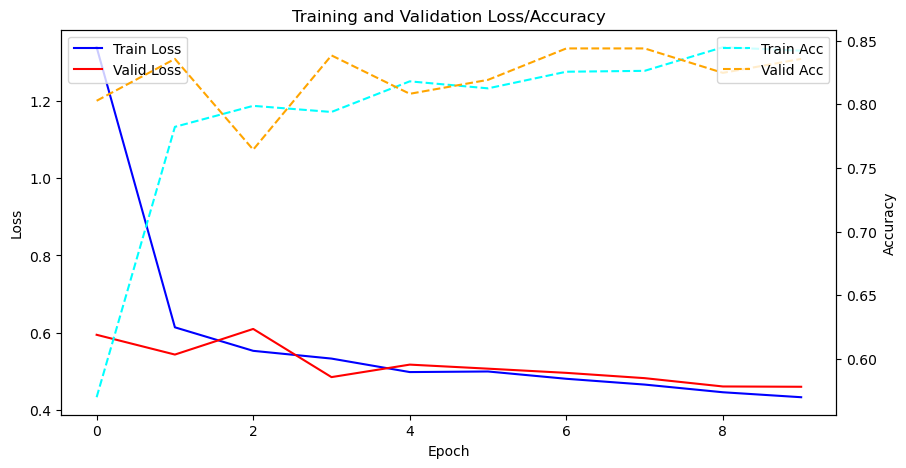

In [88]:
fig, ax1 = plt.subplots(figsize=(10,5))
    
ax1.plot(train_losses, label="Train Loss", color="blue")
ax1.plot(valid_losses, label="Valid Loss", color="red")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")
ax1.legend(loc="upper left")

ax2 = ax1.twinx()
ax2.plot(train_accuracies, label="Train Acc", color="cyan", linestyle="--")
ax2.plot(valid_accuracies, label="Valid Acc", color="orange", linestyle="--")
ax2.set_ylabel("Accuracy")
ax2.legend(loc="upper right")

plt.title("Training and Validation Loss/Accuracy")
plt.show()

In [89]:
torch.save(model.state_dict(), "checkpoints/tf_resnet18_10_2.pth")

In [90]:
model = PlantModel(num_classes=4)

state_dict = torch.load(
    r"checkpoints\tf_resnet18_10_2.pth",
    map_location=device,
    weights_only=True
)

model.load_state_dict(state_dict)
model.to(device)
model.eval()

PlantModel(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [91]:
transforms = transforms.Compose([
    transforms.Resize((SIZE, SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

In [92]:
correct = 0
total = 0

model.eval()
with torch.no_grad():
    for images, labels in tqdm(valid_loader, desc="Validation"):
        images, labels = images.to(device), labels.to(device)
        labels = labels.long()

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        correct += (predicted == labels).sum().item()
        total += labels.size(0)

val_accuracy = correct / total
print(f"Validation Accuracy: {val_accuracy:.4f}")

Validation: 100%|██████████| 6/6 [00:24<00:00,  4.01s/it]

Validation Accuracy: 0.8356


In [93]:
import numpy as np

def get_leaf_disease(img_path, model, transforms, show=True):
    img = Image.open(img_path).convert("RGB")

    # Transform and move to device
    input_tensor = transforms(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        probs = probs.cpu().numpy()[0]

    # Get predicted class
    pred_idx = np.argmax(probs)
    predicted_class = classes[pred_idx]
    predicted_prob = probs[pred_idx]

    if show:
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.axis("off")
        title = f"{predicted_class}: {predicted_prob:.2f}"
        plt.title(title, fontsize=12)
        plt.show()

    return (predicted_class, predicted_prob), probs

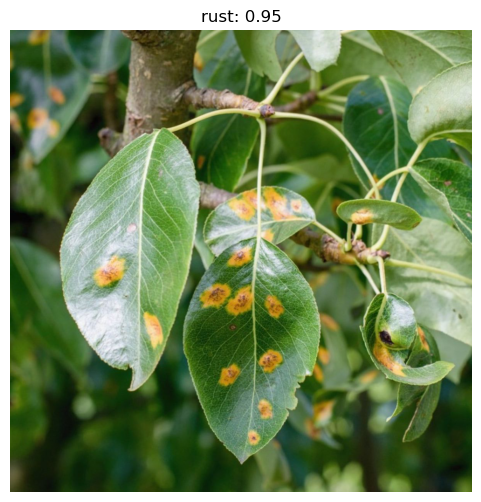

healthy: 0.000
multiple_diseases: 0.052
rust: 0.947
scab: 0.000


In [94]:
predicted, probs = get_leaf_disease(
    img_path="rust.jpg",
    model=model,
    transforms=transforms,
    show=True
)

for label, prob in zip(classes, probs):
    print(f"{label}: {prob:.3f}")

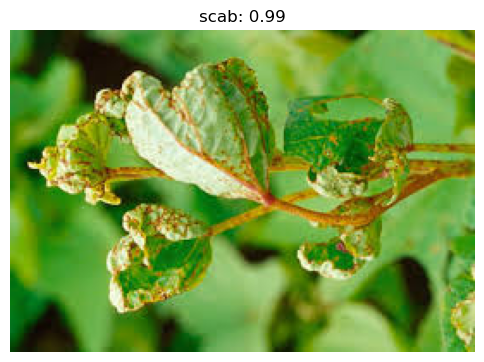

healthy: 0.001
multiple_diseases: 0.008
rust: 0.005
scab: 0.986


In [96]:
predicted, probs = get_leaf_disease(
    img_path="scab.jpg",
    model=model,
    transforms=transforms,
    show=True
)

for label, prob in zip(classes, probs):
    print(f"{label}: {prob:.3f}")

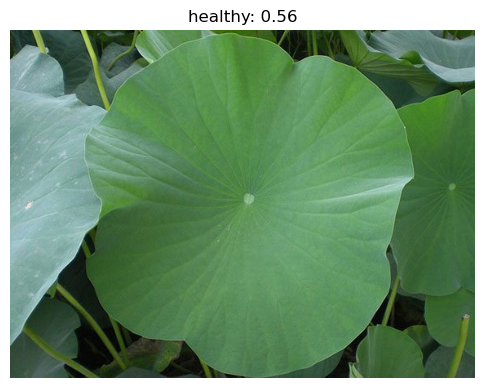

healthy: 0.558
multiple_diseases: 0.002
rust: 0.439
scab: 0.000


In [97]:
predicted, probs = get_leaf_disease(
    img_path="lotus.jpg",
    model=model,
    transforms=transforms,
    show=True
)

for label, prob in zip(classes, probs):
    print(f"{label}: {prob:.3f}")

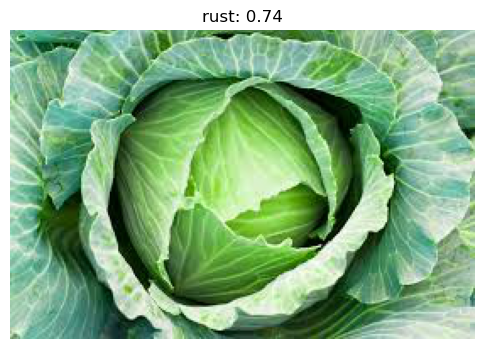

healthy: 0.222
multiple_diseases: 0.020
rust: 0.744
scab: 0.013


In [98]:
predicted, probs = get_leaf_disease(
    img_path="cabbage.jpg",
    model=model,
    transforms=transforms,
    show=True
)

for label, prob in zip(classes, probs):
    print(f"{label}: {prob:.3f}")